<a href="https://colab.research.google.com/github/Winleynnn/eq_opt/blob/main/Equations.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Instructions

*Для запуска кода и получения результатов необходимо выполнить последовательно следующие шаги:*  
1. Выгрузить в корневую папку Google Drive исходные файлы с дифференциальными и интегральными функциями  
2. Во вкладке "Среда выполнения" Google Colab нажать "Выполнить все"  
3. Ввести абсолютный путь к файлу с его названием (или просто название файла, если он лежит в корневом каталоге Google Drive)
4. Разрешить доступ к Google Drive в открывшемся при выполнении кода окне
5. После выполнения кода графики появятся в новых папках корневого каталога с названиями "plots" и "int_plots". Результаты для дифференцированных и интегральных функций сохраняются в корневом каталоге Google Drive с названиями "res_table.xlsx" и "int_res_table.xlsx" соответственно

#Importing libraries and uploading the data

In [ ]:
from scipy.optimize import curve_fit
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import openpyxl
from openpyxl.styles import Alignment

In [ ]:
diff_path = input("Введите полное название файла с дифференциальными функциями: ")

Введите полное название файла с дифференциальными функциями: diff.xlsx


In [ ]:
int_path = input("Введите полное название файла с интегральными функциями: ")

Введите полное название файла с интегральными функциями: int.xlsx


In [ ]:
from google.colab import drive
drive.mount('/content/drive')
!mkdir -p "/content/drive/My Drive/plots"
!mkdir -p "/content/drive/My Drive/int_plots"
diff_xl = openpyxl.load_workbook('/content/drive/MyDrive/' + diff_path)
dws = diff_xl.worksheets[0]
dws.delete_rows(dws.min_row, 1)
diff_data = pd.DataFrame(dws.values)
diff_data = diff_data.drop(0, axis=1)
diff_data.columns = diff_data.iloc[0]
diff_data = diff_data[1:]
diff_xl.save('/content/drive/MyDrive/new.xlsx')
int_xl = openpyxl.load_workbook('/content/drive/MyDrive/' + int_path)
iws = int_xl.worksheets[0]
iws.delete_rows(iws.min_row, 1)
int_data = pd.DataFrame(iws.values)
int_data = int_data.drop(0, axis=1)
int_data.columns = int_data.iloc[0]
int_data = int_data[1:]

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


/usr/local/lib/python3.10/dist-packages/openpyxl/worksheet/header_footer.py:48: UserWarning: Cannot parse header or footer so it will be ignored
  warn("""Cannot parse header or footer so it will be ignored""")
/usr/local/lib/python3.10/dist-packages/openpyxl/worksheet/header_footer.py:48: UserWarning: Cannot parse header or footer so it will be ignored
  warn("""Cannot parse header or footer so it will be ignored""")


In [ ]:
diff_data.head()

,"t, сек","dt, cек","dt, мин","t, мин","h, мм","h, мм","dh, mm","dh, cm3",T1(1),T1(2),...,T20(1),T21(1),T22(1),T23(2),None,None,Num,MIN,MAX,AV
1,0,15,0.25,0.25,204,204,23,36.561375,0.207,0.135,...,0.216,0.225,0.207,0.126,None,None,=COUNT(J3:AZ3),=MIN(J3:AZ3),=MAX(J3:AZ3),=AVERAGE(J3:AZ3)
2,15,15,0.25,0.5,227,227,15,23.844375,0.135,0.135,...,0.216,0.225,0.207,0.108,None,None,=COUNT(J4:AZ4),=MIN(J4:AZ4),=MAX(J4:AZ4),=AVERAGE(J4:AZ4)
3,30,15,0.25,0.75,242,242,18,28.61325,0.162,0.126,...,0.198,0.225,0.198,0.099,None,None,=COUNT(J5:AZ5),=MIN(J5:AZ5),=MAX(J5:AZ5),=AVERAGE(J5:AZ5)
4,45,15,0.25,1,260,260,10,15.89625,0.09,0.126,...,0.198,0.207,0.198,0.099,None,None,=COUNT(J6:AZ6),=MIN(J6:AZ6),=MAX(J6:AZ6),=AVERAGE(J6:AZ6)
5,60,15,0.25,1.25,270,270,10,15.89625,0.09,0.126,...,0.198,0.207,0.198,0.099,None,None,=COUNT(J7:AZ7),=MIN(J7:AZ7),=MAX(J7:AZ7),=AVERAGE(J7:AZ7)


In [ ]:
diff_data.columns

Index([ 't, сек', 'dt, cек', 'dt, мин',  't, мин',   'h, мм',   'h, мм',
        'dh, mm', 'dh, cm3',   'T1(1)',   'T1(2)',   'T1(3)',   'T2(1)',
         'T2(2)',   'T3(1)',   'T3(2)',   'T4(1)',   'T4(2)',   'T4(3)',
         'T5(1)',   'T5(2)',   'T6(2)',   'T7(1)',   'T7(2)',   'T7(3)',
         'T8(2)',   'T9(1)',   'T9(2)',   'T9(3)',   'T9(4)',  'T10(1)',
        'T10(2)',  'T10(3)',  'T11(1)',  'T11(2)',  'T11(3)',  'T12(1)',
        'T13(1)',  'T13(2)',  'T13(3)',  'T14(2)',  'T15(2)',  'T16(2)',
        'T17(2)',  'T18(1)',  'T18(2)',  'T19(1)',  'T19(2)',  'T20(1)',
        'T21(1)',  'T22(1)',  'T23(2)',      None,      None,     'Num',
           'MIN',     'MAX',      'AV'],
      dtype='object', name=0)

#Declaring optimization class

In [ ]:
class Equation():
    def __init__(self, data: pd.DataFrame, columns_to_optimize:list, integrated: bool) -> object:
        self.data = data
        data = self.data
        data = data[data['t, мин']> 0]
        self.data=data
        self.columns_to_optimize = columns_to_optimize
        self.metrics = None
        self.metric_df = None
        self.result_df = None
        self.integrated = integrated
    @property
    def used_data(self) -> pd.DataFrame:
        return self.data
    @property
    def columns(self):
        return self.data.columns
    @property
    def dict_metrics(self) -> dict:
        if(self.metrics != None):
            return self.metrics
        else:
            print("Optimization wasn't conducted")
    def print_metrics(self, func_name_list):
        for func_metric in list(self.metrics.keys()):
            if(func_metric.split(sep=' ')[1] in func_name_list):
                rmser = self.metrics[func_metric]
                print(f"{func_metric}: RMSE, R^2 equals to {rmser[0]:.3f}; {rmser[1]:.3f}")
    def save_table(self):
        if self.integrated:
            self.metric_df.to_excel('/content/drive/MyDrive/int_metrics_table.xlsx')
        else:
            self.metric_df.to_excel('/content/drive/MyDrive/metrics_table.xlsx')
    def save_res(self):
        if self.integrated:
            self.result_df.to_excel('/content/drive/MyDrive/int_res_table.xlsx')
            workbook = openpyxl.load_workbook('/content/drive/MyDrive/int_res_table.xlsx')
        else:
            self.result_df.to_excel('/content/drive/MyDrive/res_table.xlsx')
            workbook = openpyxl.load_workbook('/content/drive/MyDrive/res_table.xlsx')
        worksheet = workbook.worksheets[0]
        worksheet.insert_rows(1)
        worksheet.cell(row=1, column=4).value = 'HORTON'
        worksheet.cell(row=1, column=12).value = 'PHILIP'
        worksheet.cell(row=1, column=19).value = 'KOSTYAKOV'
        worksheet.cell(row=1, column=27).value = 'KOSTYAKOV-M'
        worksheet.merge_cells('D1:K1')
        worksheet.merge_cells('L1:R1')
        worksheet.merge_cells('S1:Z1')
        worksheet.merge_cells('AA1:AH1')
        worksheet.alignment = Alignment(horizontal="center")
        if self.integrated:
            workbook.save('/content/drive/MyDrive/int_res_table.xlsx')
        else:
            workbook.save('/content/drive/MyDrive/res_table.xlsx')
    @property
    def metrics_as_df(self):
        return self.metric_df
    @property
    def results(self):
        return self.result_df
    def optimize(self, func_names: list):
        y = self.columns_to_optimize
        plt.rcParams['figure.figsize'] = [12, 9]
        def calculate_metrics(target: np.ndarray, optimized: np.ndarray) -> np.ndarray:
            ss_res = np.dot((target - optimized),(target - optimized))
            ymean = np.mean(target)
            opt_mean = np.mean(optimized)
            ss_tot = np.dot((target-ymean),(target-ymean))
            corr_coef = np.dot((optimized - opt_mean),(target - ymean))/(np.sqrt(np.dot((optimized - opt_mean),((optimized - opt_mean))))*np.sqrt(np.dot((target - ymean),((target - ymean)))))
            nse = 1 - np.dot((optimized - opt_mean),((optimized - opt_mean)))/np.dot((target - ymean),((target - ymean)))
            r = np.corrcoef(target.astype(np.float64), optimized.astype(np.float64))[0][1]
            alpha = np.std(optimized)/np.std(target)
            beta = np.mean(optimized)/np.mean(target)
            kge = 1 - np.sqrt(np.dot((r - 1),(r - 1)) + np.dot((alpha - 1), (alpha - 1)) + np.dot((beta - 1),(beta - 1)))
            #order of metrics:
            #1 - rmse, 2 - common r squared, 3 - corr coef, 4 - Nash–Sutcliffe model efficiency coefficient, 5 - Kling–Gupta efficiency
            metric_array = [np.sqrt(np.mean((target-optimized)**2)), 1-ss_res/ss_tot, corr_coef, nse, kge]
            return metric_array
        if not self.integrated:
            def horton(t, i_0, i_1, k):
                return (i_0-i_1)*np.exp((-k*t).astype(np.float)) + i_1
            def philip(t, S, i_1):
                return 0.5*S*t**(-0.5) + i_1
            def kostyakov(t, i_0, i_1, n):
                return i_0*t**-n + i_1
            def kostyakov_mod(t, i_0, i_1, n):
                return (i_0-i_1)*t**-n + i_1
        else:
            def horton(t, i_0, i_1, k):
                return (i_0-i_1)/k*(1-np.exp((-k*t).astype(np.float))) + i_1*t
            def philip(t, S, i_1):
                return S*t**(0.5) + i_1*t
            def kostyakov(t, i_0, i_1, n):
                return i_0*t**1-n + i_1*t
            def kostyakov_mod(t, i_0, i_1, n):
                return (i_0-i_1)*t**1-n + i_1*t
        all_metrics = {}
        all_results = []
        for column in y:
            section = self.data[(self.data[column] > 0) & (self.data['t, мин'] > 0)]
            t = section['t, мин'].to_numpy()
            target = section[column].to_numpy()
            metrics = {}
            plt.plot(t, target, 'bo', label='data-' + column + "; used data point pairs: " + str(len(section[column])))
            results = []
            results.append(len(section[column]))
            for name in func_names:
                if name=='horton':
                    popt, pcov = curve_fit(horton, t, target, maxfev=2000)
                    # print(*popt)
                    optimized = horton(t, *popt)
                    if self.integrated:
                        int_name = "integrated " + name
                    label_legend = f"{int_name if self.integrated else name} eq fit:\t\t\t$i_0$=%5.3f, $i_1$=%5.3f, $k$=%5.3f" % tuple(popt)
                    color = 'r'
                elif name=='philip':
                    popt, pcov = curve_fit(philip, t, target, maxfev=2000)
                    optimized = philip(t, *popt)
                    if self.integrated:
                        int_name = "integrated " + name
                    label_legend=f'{int_name if self.integrated else name} eq fit:\t\t\t$S$=%5.3f, $i_1$=%5.3f' % tuple(popt)
                    color = '#00FFFF'
                elif name=='kostyakov':
                    popt, pcov = curve_fit(kostyakov, t, target, maxfev=2000, p0 = [target[0], target[59], 1.5],  bounds = ([-np.inf, np.min(target),0],[np.inf, np.inf, np.inf]))
                    optimized = kostyakov(t, *popt)
                    if self.integrated:
                        int_name = "integrated " + name
                    label_legend = f'{int_name if self.integrated else name} eq fit:\t   $i_0$={popt[0]:.3f}, $i_1$={popt[1]:.3f}, $n$=-{popt[2]:.3f}'
                    color = '#00ff00'
                elif name=='kostyakov_mod':
                    popt, pcov = curve_fit(kostyakov_mod, t, target, maxfev=2000, p0 = [target[0], target[59], 1.5], bounds = ([-np.inf, np.min(target), 0],[np.inf, np.inf, np.inf]))
                    optimized = kostyakov_mod(t, *popt)
                    if self.integrated:
                        int_name = "integrated " + name
                    label_legend = label=f'{int_name if self.integrated else name} eq fit: $i_0$={popt[0]:.3f}, $i_1$={popt[1]:.3f}, $n$=-{popt[2]:.3f}'
                    color = '#FF00FF'
                metric_array = calculate_metrics(target, optimized)
                metrics[name] =  metric_array
                all_metrics[column + ' ' + name] = metric_array
                label_metric = f"\n{name}: RMSE, R^2, corr_coef, NSE, KGE equals to {metric_array[0]:.3f}; {metric_array[1]:.3f};{metric_array[2]:.3f};{metric_array[3]:.3f};{metric_array[4]:.3f}\n"
                plt.plot(t, optimized, color=color,
                            label=label_legend + label_metric)
                popt = popt.tolist()
                for k in metric_array:
                    popt.append(k)
                for i in popt:
                    results.append(i)
            all_results.append(results)
            plt.xlabel('t')
            plt.ylabel('y')
            plt.legend()
            plt.savefig('/content/drive/MyDrive/plots/' + column + '.png', dpi = 150)
            plt.show()
            print()
        self.metrics = all_metrics
        metrics_df = pd.DataFrame.from_dict(self.metrics, orient='index')
        metrics_df.columns = [['RMSE', 'R_squared', 'corr_coef', 'NSE', 'KGE']]
        self.metric_df = metrics_df
        df = pd.DataFrame(all_results, columns = [ 'N',
            'i_0', 'i_1', 'k', 'RMSE', 'R_squared','corr_coef', 'NSE', 'KGE',
            'S', 'i_1', 'RMSE', 'R_squared', 'corr_coef', 'NSE', 'KGE',
            'i_0', 'i_1', 'n', 'RMSE', 'R_squared', 'corr_coef', 'NSE', 'KGE',
            'i_0', 'i_1', 'n', 'RMSE', 'R_squared','corr_coef', 'NSE', 'KGE'
        ])
        # df = pd.DataFrame(all_results, columns = [
        #     'Horton i_0', 'Horton i_1', 'Horton k', 'Horton RMSE', 'Horton R_squared',
        #     'Philip S', 'Philip i_1', 'Philip RMSE', 'Philip R_squared',
        #     'Kostyakov i_0', 'Kostyakov i_1', 'Kostyakov n', 'Kostyakov RMSE', 'Kostyakov R_squared',
        #     'Kostyakov_mod i_0', 'Kostyakov_mod i_1', 'Kostyakov_mod n', 'Kostyakov_mod RMSE', 'Kostyakov_mod R_squared',
        # ])
        df.insert(0, "Exp_func", ['T1(1)', 'T1(2)', 'T1(3)', 'T2(1)', 'T2(2)', 'T3(1)',
       'T3(2)', 'T4(1)', 'T4(2)', 'T4(3)', 'T5(1)', 'T5(2)', 'T6(2)', 'T7(1)',
       'T7(2)', 'T7(3)', 'T8(2)', 'T9(1)', 'T9(2)', 'T9(3)', 'T9(4)', 'T10(1)',
       'T10(2)', 'T10(3)', 'T11(1)', 'T11(2)', 'T11(3)', 'T12(1)', 'T13(1)',
       'T13(2)', 'T13(3)', 'T14(2)', 'T15(2)', 'T16(2)', 'T17(2)', 'T18(1)',
       'T18(2)', 'T19(1)', 'T19(2)', 'T20(1)', 'T21(1)', 'T22(1)', 'T23(2)'])
        self.result_df = df


#Optimization and it's results for original functions

*Uploading original data and stating experimantal functions to optimize*

In [ ]:
columns = ['T1(1)', 'T1(2)', 'T1(3)', 'T2(1)', 'T2(2)', 'T3(1)',
       'T3(2)', 'T4(1)', 'T4(2)', 'T4(3)', 'T5(1)', 'T5(2)', 'T6(2)', 'T7(1)',
       'T7(2)', 'T7(3)', 'T8(2)', 'T9(1)', 'T9(2)', 'T9(3)', 'T9(4)', 'T10(1)',
       'T10(2)', 'T10(3)', 'T11(1)', 'T11(2)', 'T11(3)', 'T12(1)', 'T13(1)',
       'T13(2)', 'T13(3)', 'T14(2)', 'T15(2)', 'T16(2)', 'T17(2)', 'T18(1)',
       'T18(2)', 'T19(1)', 'T19(2)', 'T20(1)', 'T21(1)', 'T22(1)', 'T23(2)']
equation = Equation(data=diff_data, columns_to_optimize=columns, integrated = False)

*Output of graphs for each experimental function*

<ipython-input-98-24adafb4d075>:82: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  return (i_0-i_1)*np.exp((-k*t).astype(np.float)) + i_1


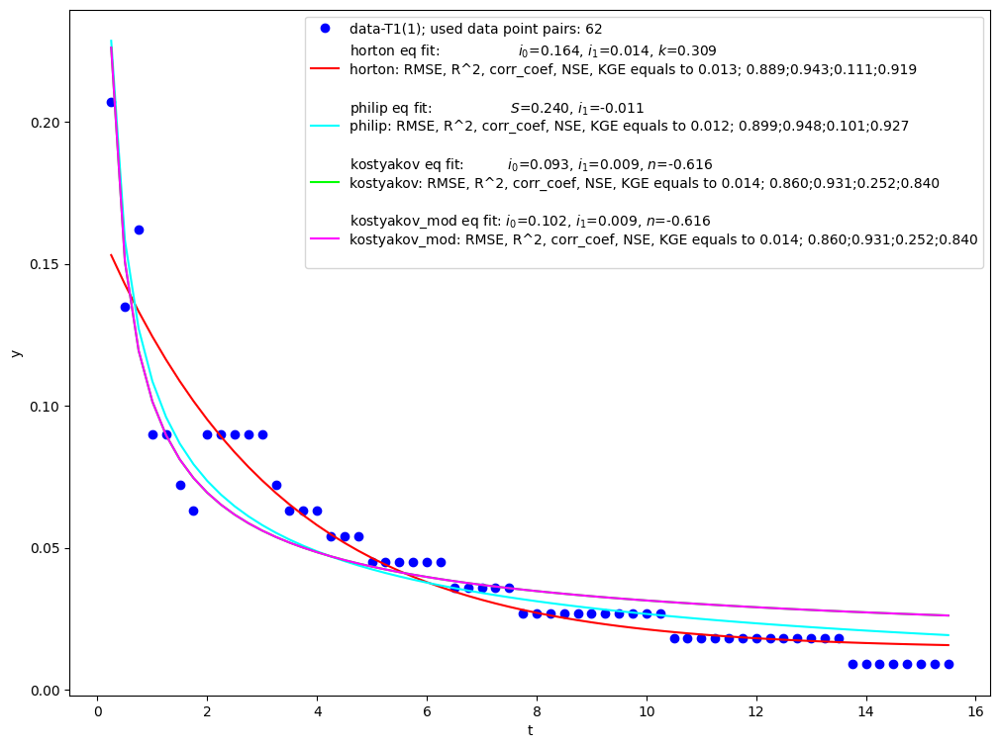

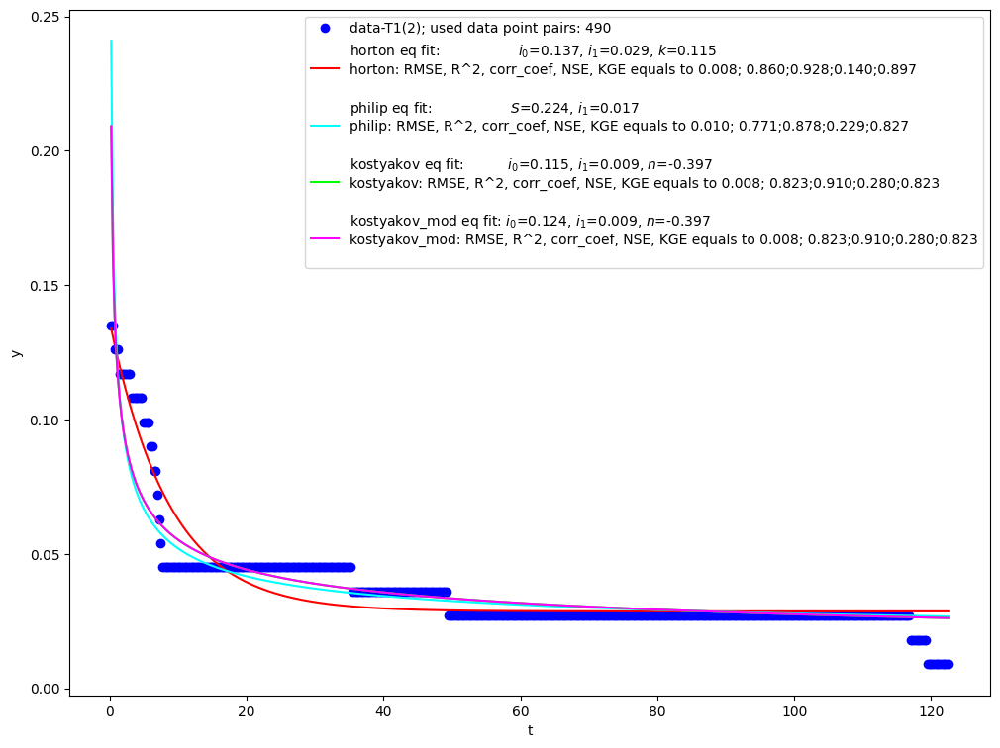

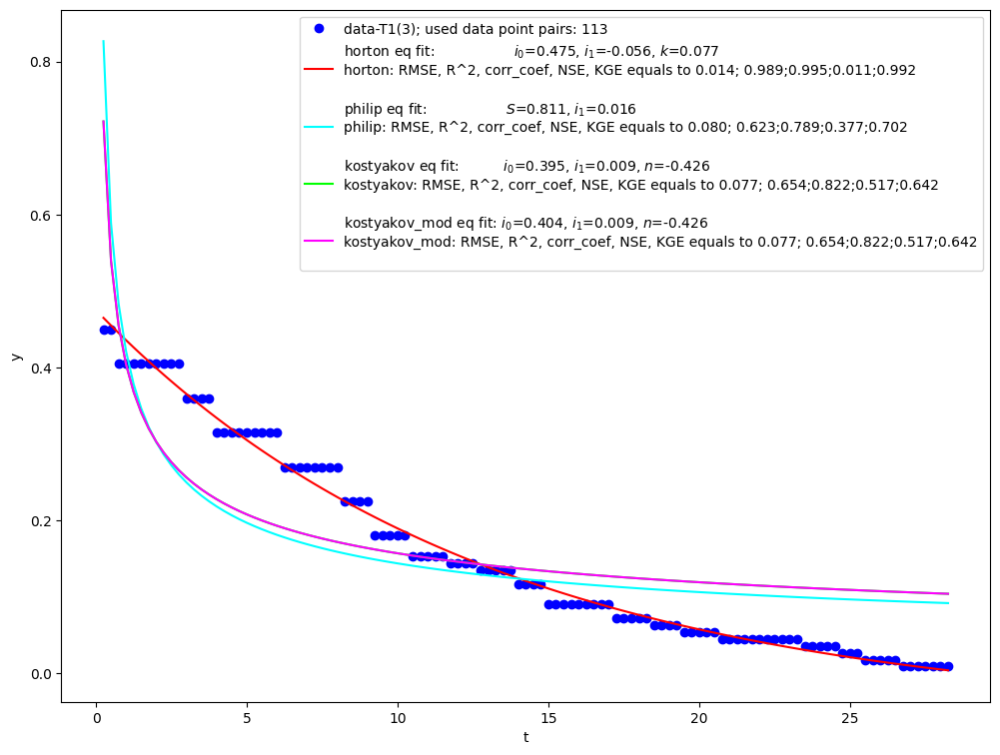

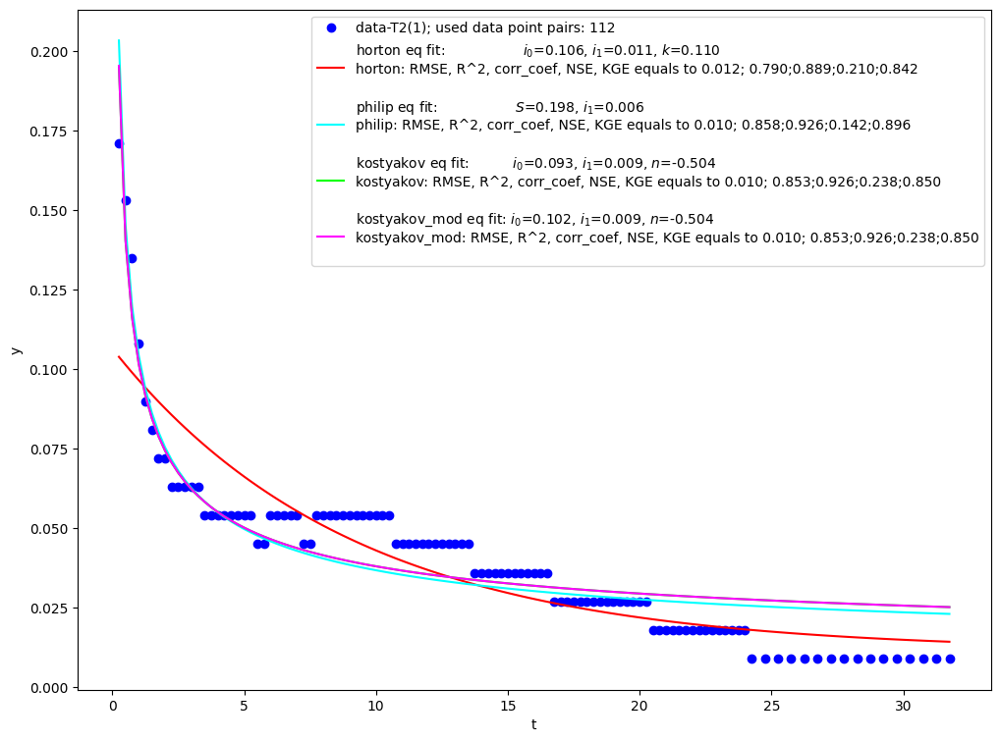

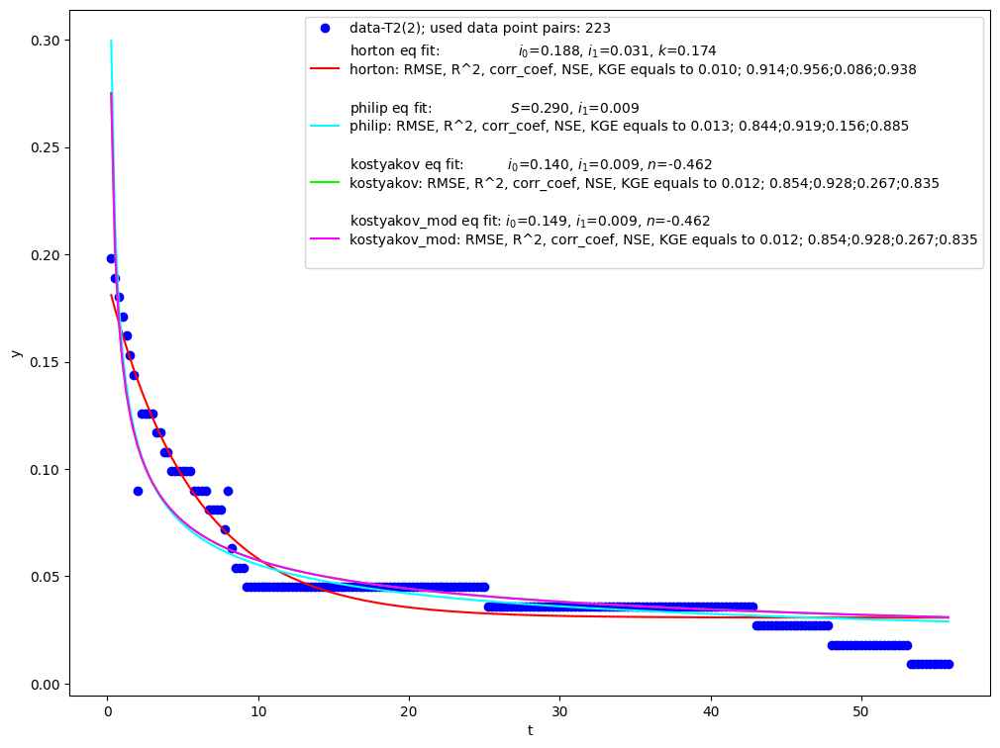

...

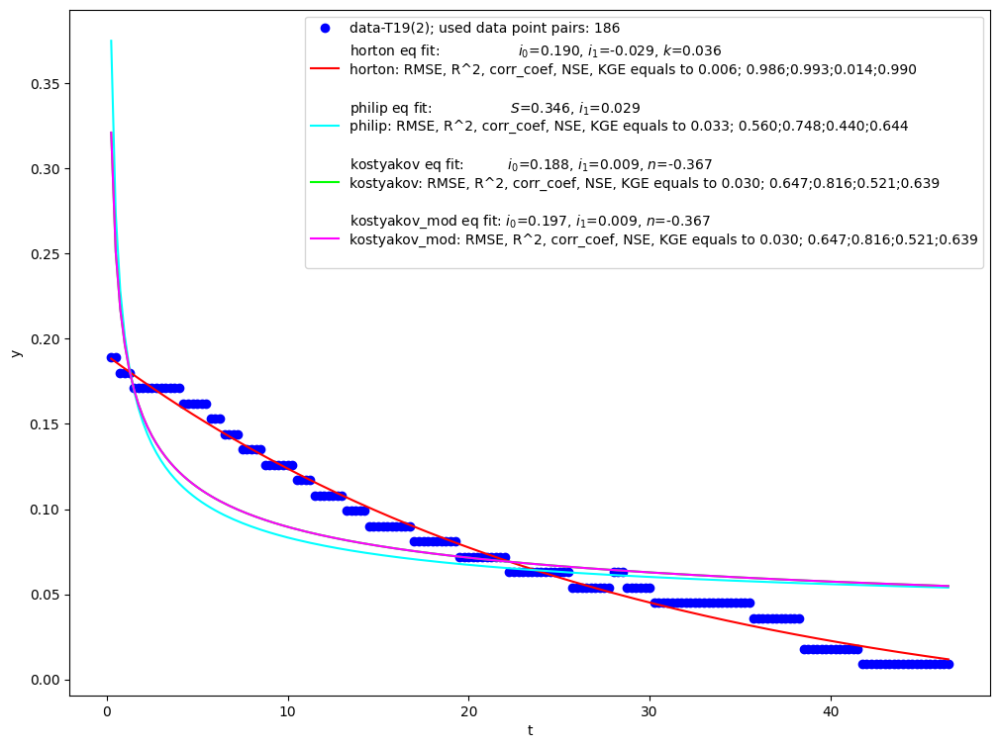

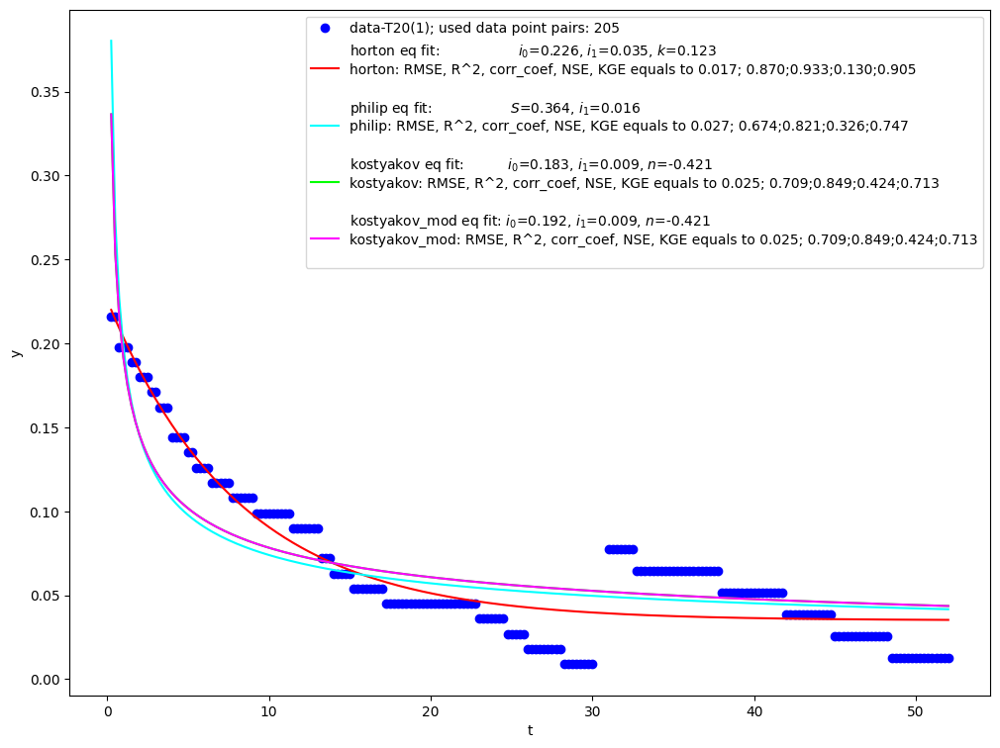

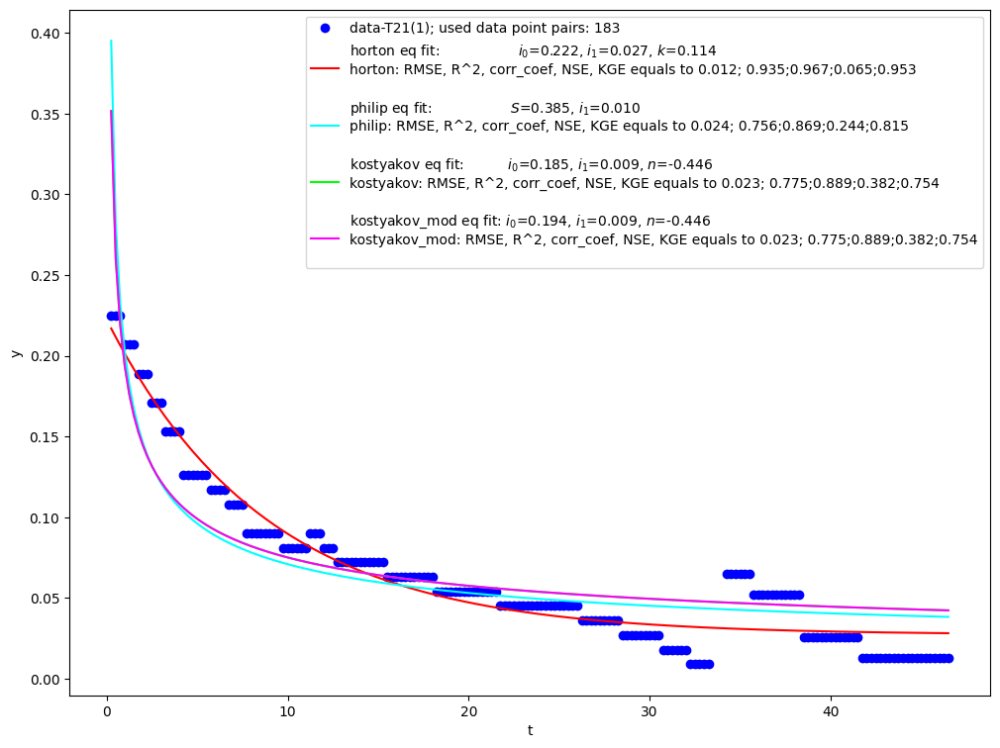

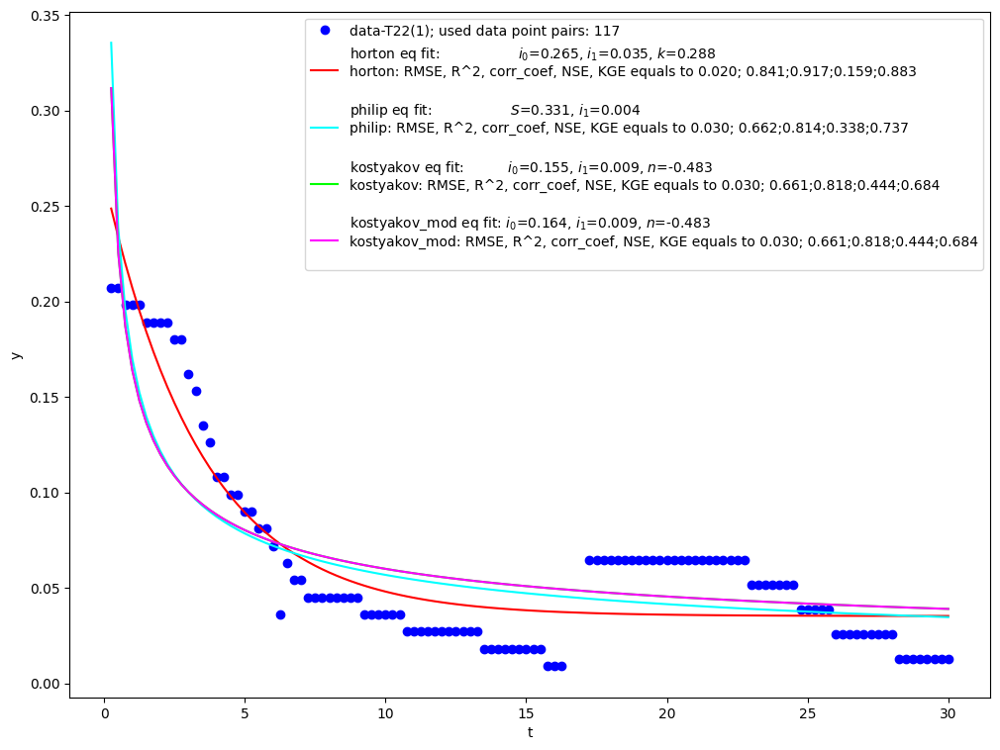

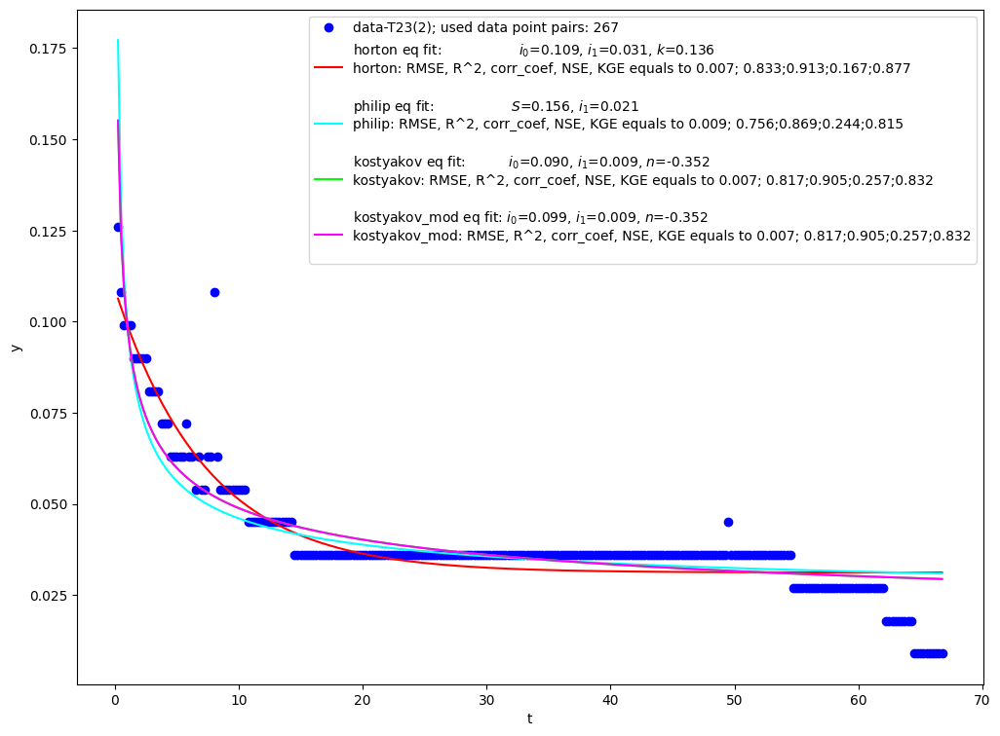

In [ ]:
equation.optimize(['horton', 'philip', 'kostyakov', 'kostyakov_mod'])

*Output RMSE and R Squared for each experimental function*

In [ ]:
pd.options.display.max_rows = None
equation.metrics_as_df

,RMSE,R_squared,corr_coef,NSE,KGE
T1(1) horton,0.012635,0.888774,0.942748,0.111226,0.919034
T1(1) philip,0.012048,0.898866,0.948086,0.101134,0.926582
T1(1) kostyakov,0.014188,0.859750,0.931458,0.252319,0.840309
T1(1) kostyakov_mod,0.014188,0.859750,0.931458,0.252322,0.840307
T1(2) horton,0.007510,0.860270,0.927508,0.139730,0.897480
T1(2) philip,0.009624,0.770527,0.877796,0.229473,0.827178
T1(2) kostyakov,0.008464,0.822514,0.909741,0.279745,0.822598
T1(2) kostyakov_mod,0.008464,0.822514,0.909741,0.279747,0.822597
T1(3) horton,0.013577,0.989175,0.994573,0.010825,0.992325
T1(3) philip,0.080106,0.623163,0.789407,0.376837,0.702176


*Output all results, including all parameters ant metrics, for each experimental function*

In [ ]:
equation.result_df

,Exp_func,N,i_0,i_1,k,RMSE,R_squared,corr_coef,NSE,KGE,...,NSE,KGE,i_0,i_1,n,RMSE,R_squared,corr_coef,NSE,KGE
0,T1(1),62,0.164225,0.014448,0.309037,0.012635,0.888774,0.942748,0.111226,0.919034,...,0.252319,0.840309,0.101527,0.009000,0.615529,0.014188,0.859750,0.931458,0.252322,0.840307
1,T1(2),490,0.136873,0.028632,0.114773,0.007510,0.860270,0.927508,0.139730,0.897480,...,0.279745,0.822598,0.124478,0.009000,0.396785,0.008464,0.822514,0.909741,0.279747,0.822597
2,T1(3),113,0.475083,-0.056127,0.077083,0.013577,0.989175,0.994573,0.010825,0.992325,...,0.516985,0.641718,0.403898,0.009000,0.425938,0.076756,0.654024,0.821806,0.516976,0.641723
3,T2(1),112,0.106458,0.011480,0.110129,0.012497,0.789511,0.888544,0.210489,0.842378,...,0.238478,0.850310,0.101686,0.009000,0.503663,0.010448,0.852886,0.925874,0.238478,0.850310
4,T2(2),223,0.187718,0.030647,0.174385,0.009545,0.913699,0.955876,0.086301,0.937599,...,0.266972,0.835375,0.149241,0.009000,0.462259,0.012410,0.854110,0.928423,0.266970,0.835376
5,T3(1),112,0.178311,0.024621,0.495076,0.008774,0.892996,0.944984,0.107004,0.922196,...,0.135274,0.918092,0.097213,0.009000,0.586673,0.007016,0.931576,0.966467,0.135274,0.918093
6,T3(2),559,0.170416,0.025391,0.280345,0.003880,0.940349,0.969716,0.059651,0.957172,...,0.151259,0.888661,0.110716,0.014147,0.521275,0.006178,0.848741,0.921271,0.151259,0.888661
7,T4(1),329,0.246795,0.037526,0.197163,0.010733,0.907208,0.952474,0.092792,0.932789,...,0.287887,0.815473,0.181128,0.009000,0.442790,0.015113,0.816033,0.906574,0.287889,0.815472
8,T4(2),245,0.207911,0.034519,0.086759,0.012455,0.917987,0.958117,0.082013,0.940768,...,0.376265,0.759578,0.199522,0.009000,0.397786,0.020495,0.777920,0.889434,0.376249,0.759586
9,T4(3),64,0.436479,-3.301631,0.005502,0.032349,0.887475,0.942059,0.112527,0.918058,...,0.736477,0.397867,0.375398,0.162000,0.361329,0.074912,0.396560,0.645959,0.736476,0.397868


*Save all results*

In [ ]:
equation.save_res()

#Optimization and it's results for integrated functions

*Uploading integrated data and stating integrated experimantal functions to optimize*

In [ ]:
int_equation = Equation(data=int_data, columns_to_optimize=columns, integrated=True)

*Output of graphs for each integrated experimental function*

<ipython-input-98-24adafb4d075>:91: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  return (i_0-i_1)/k*(1-np.exp((-k*t).astype(np.float))) + i_1*t


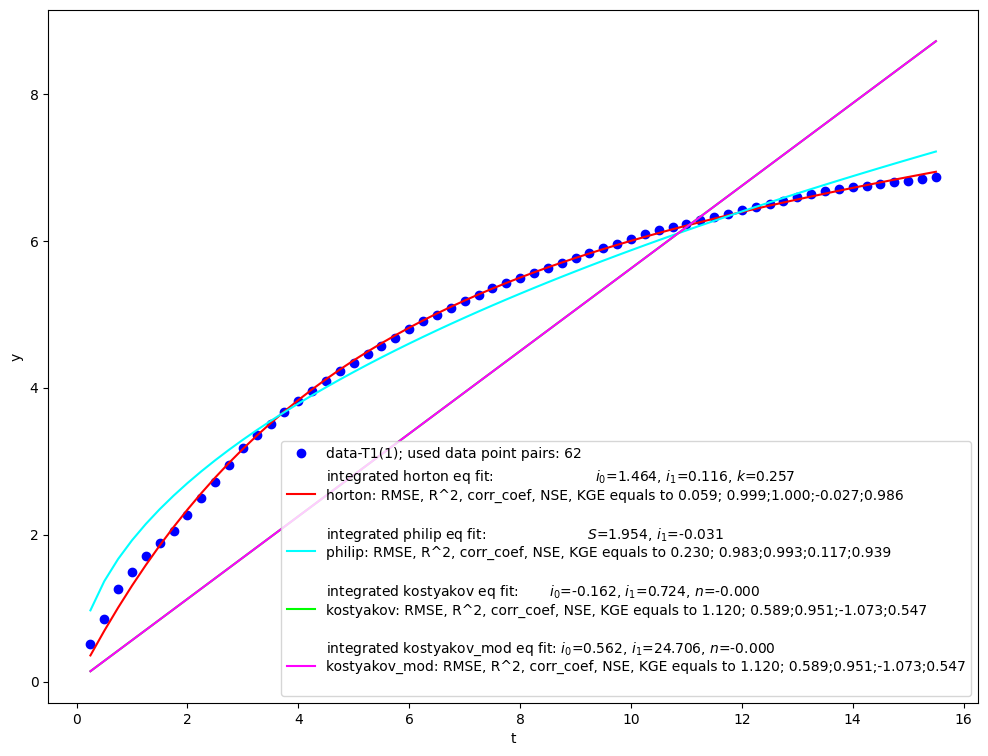

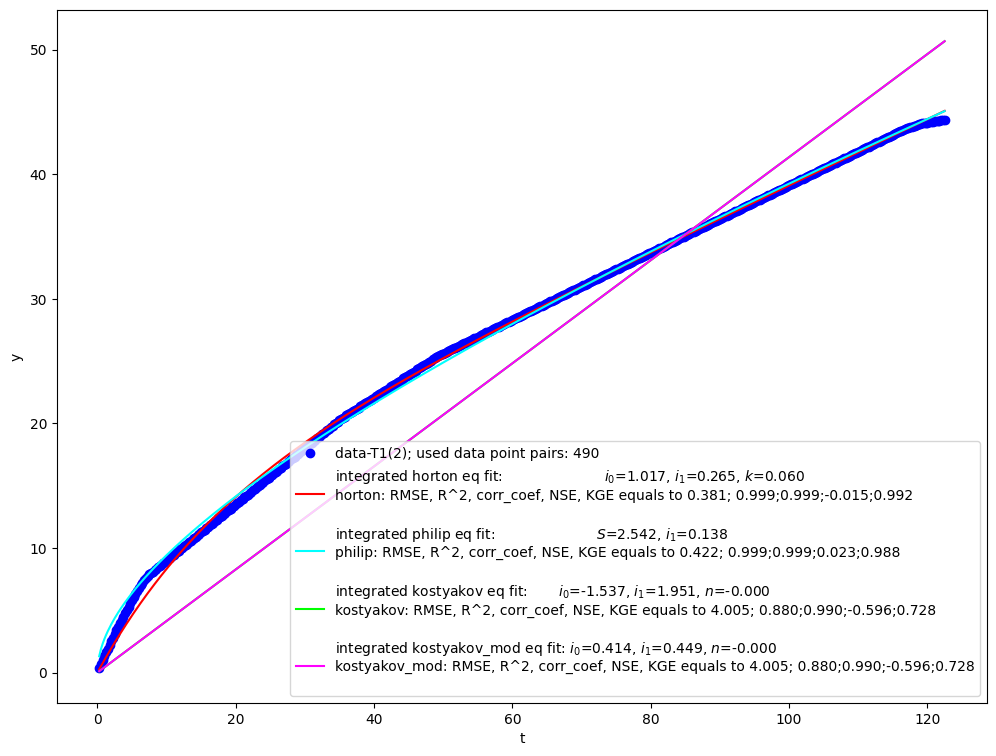

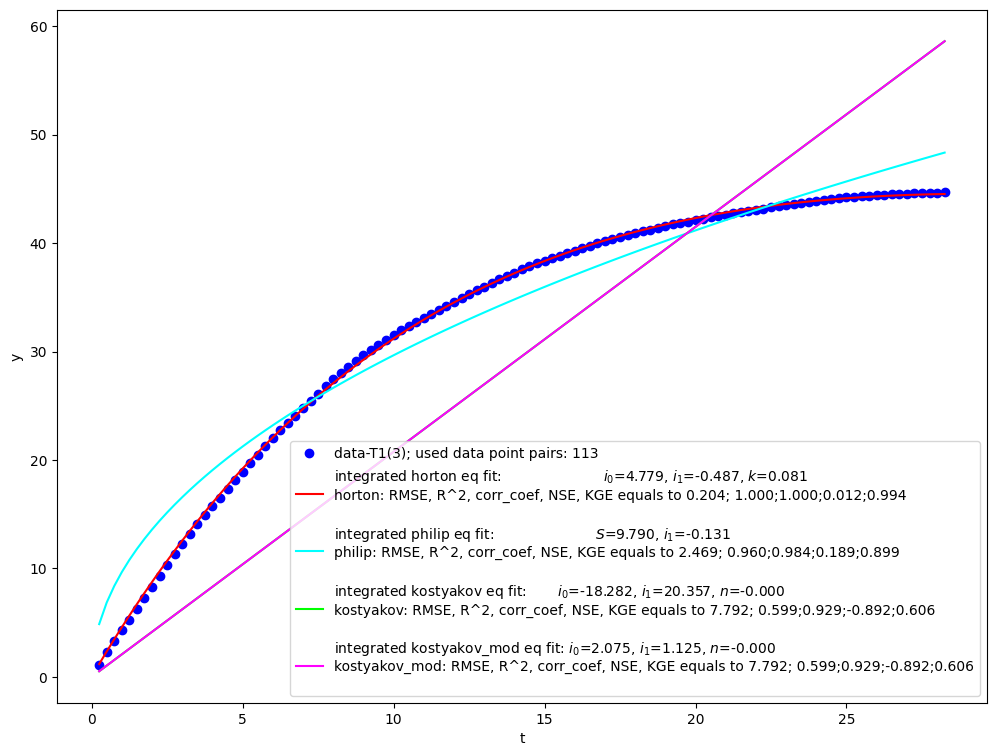

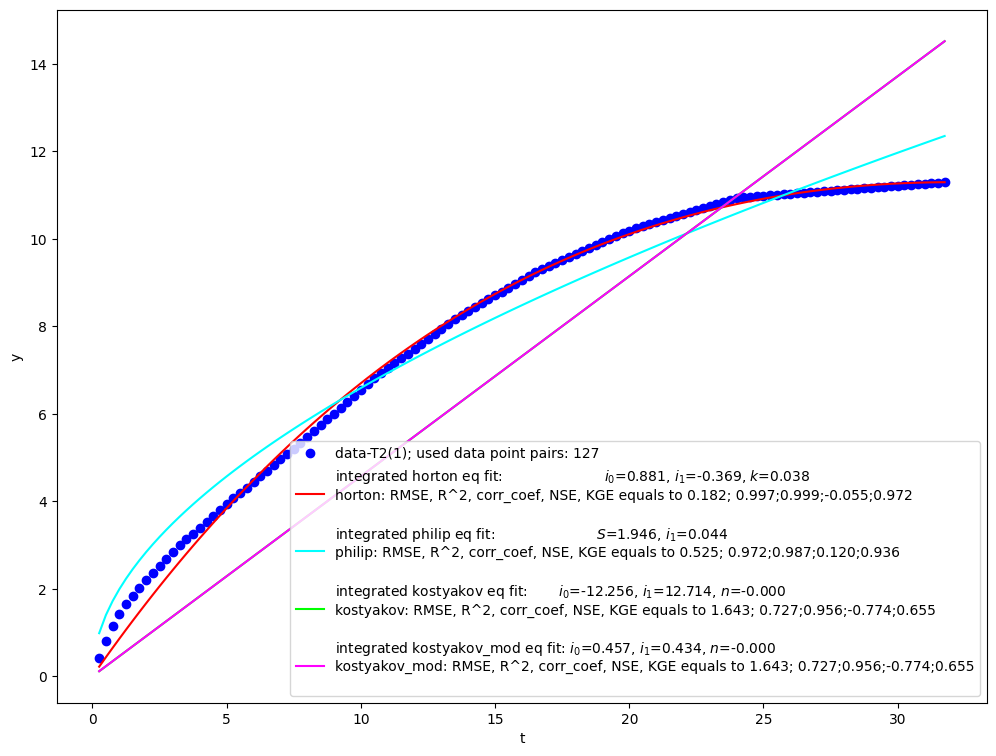

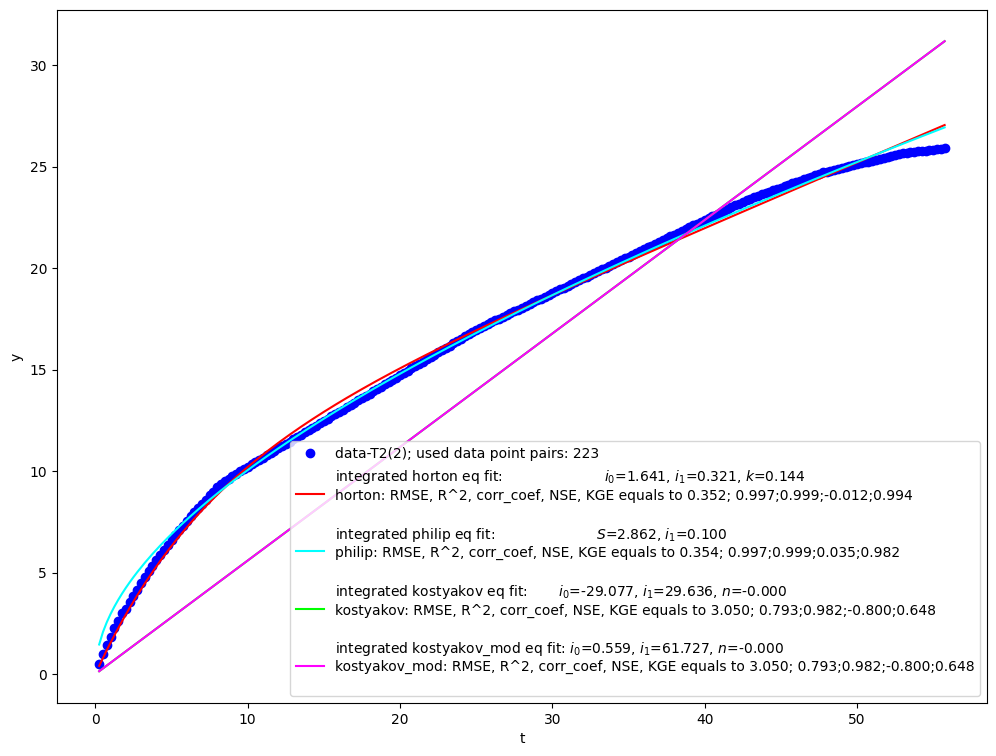

...

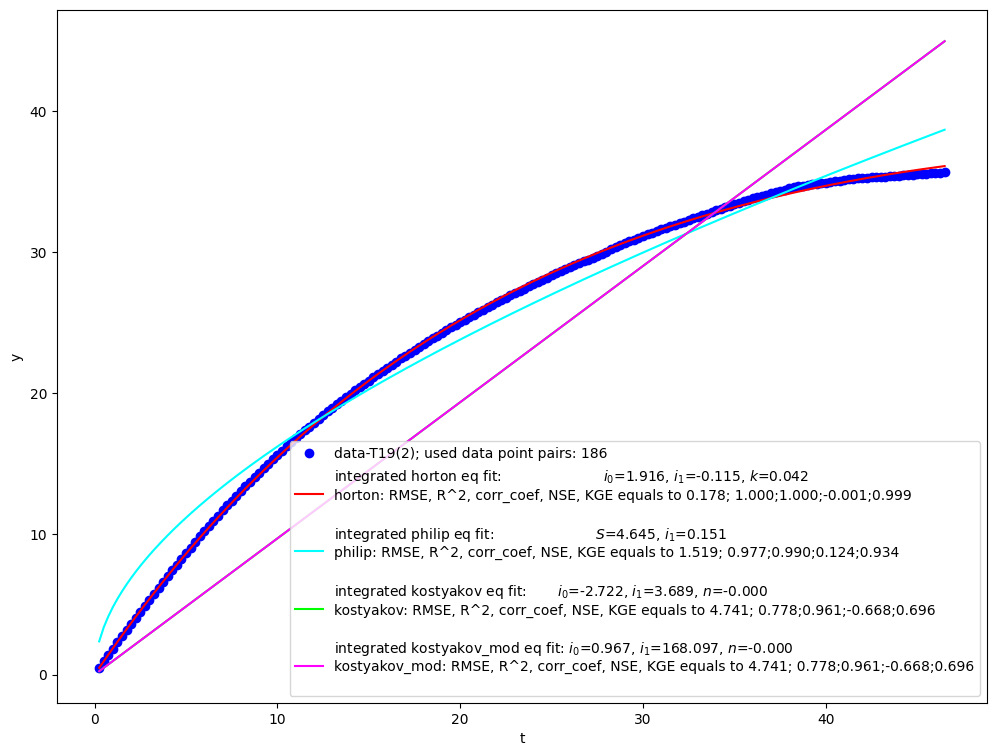

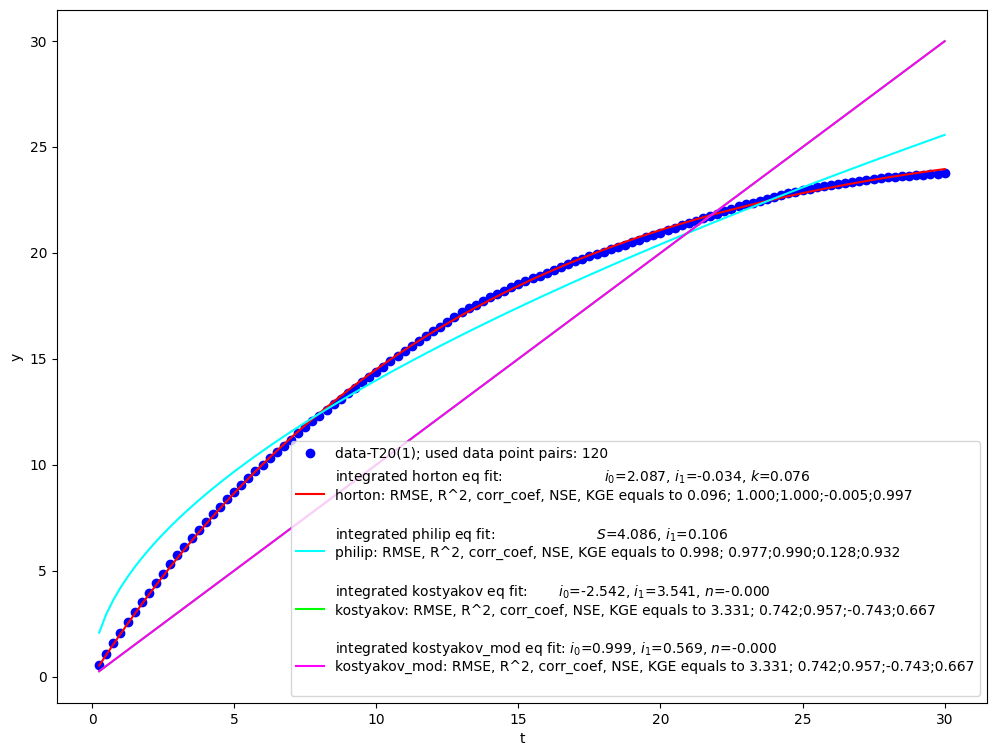

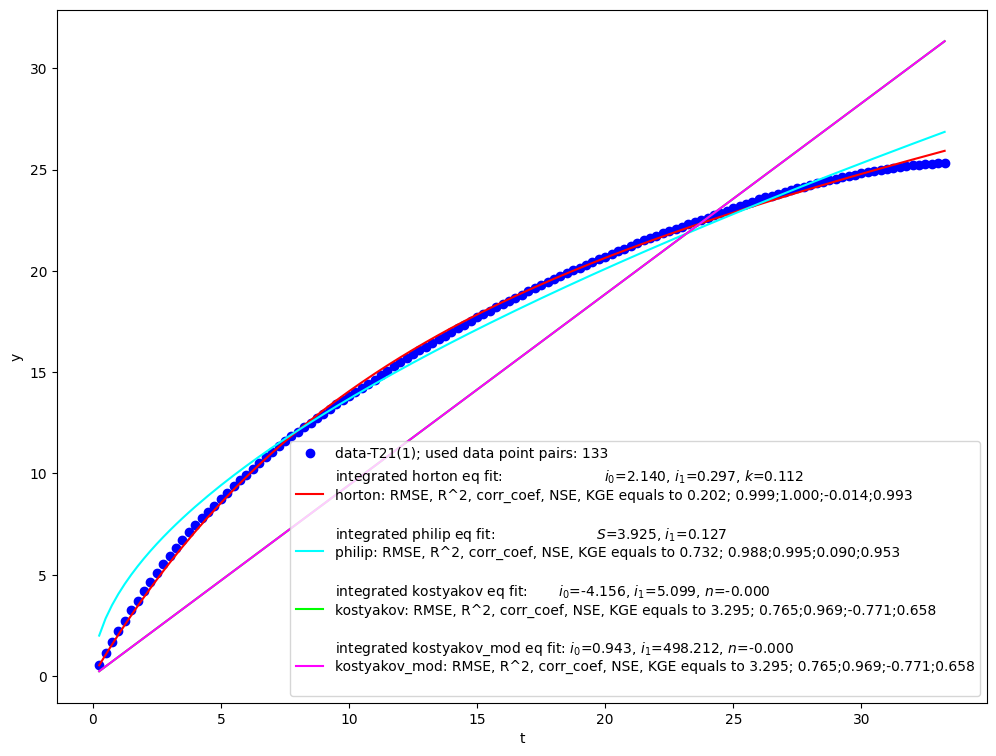

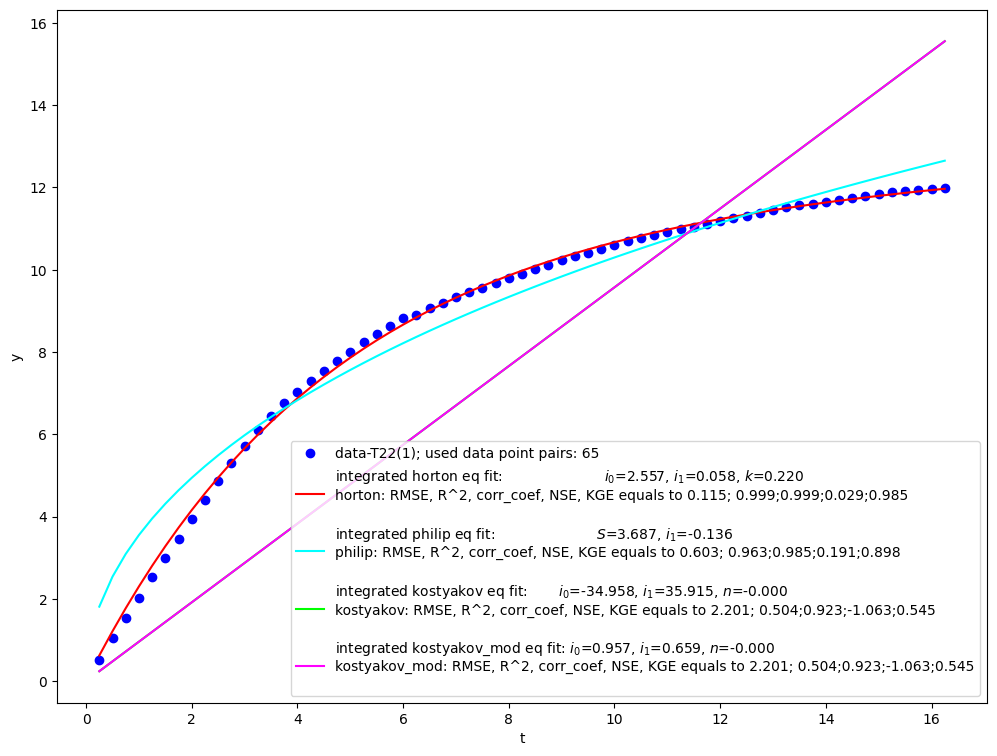

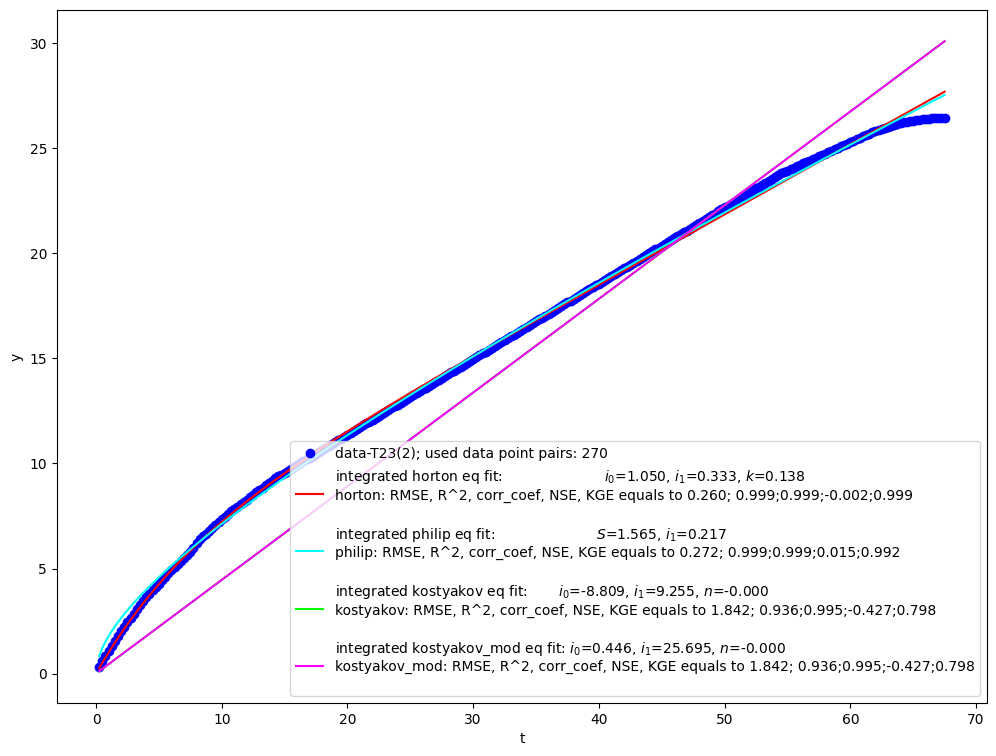

In [ ]:
int_equation.optimize(['horton', 'philip', 'kostyakov', 'kostyakov_mod'])

*Output RMSE and R Squared for each integrated experimental function*

In [ ]:
int_equation.metrics_as_df

,RMSE,R_squared,corr_coef,NSE,KGE
T1(1) horton,0.059447,0.998843,0.999532,-0.027228,0.986351
T1(1) philip,0.230454,0.982608,0.992856,0.117255,0.938800
T1(1) kostyakov,1.119805,0.589366,0.951273,-1.072731,0.546736
T1(1) kostyakov_mod,1.119805,0.589366,0.951273,-1.072731,0.546736
T1(2) horton,0.380931,0.998918,0.999499,-0.015499,0.992119
T1(2) philip,0.422406,0.998669,0.999406,0.023162,0.988170
T1(2) kostyakov,4.004709,0.880363,0.989921,-0.596049,0.728067
T1(2) kostyakov_mod,4.004709,0.880363,0.989921,-0.596049,0.728067
T1(3) horton,0.203795,0.999726,0.999883,0.012105,0.993871
T1(3) philip,2.469238,0.959704,0.983531,0.188702,0.898824


*Output all results, including all parameters ant metrics, for each integrated experimental function*

In [ ]:
int_equation.result_df

,Exp_func,N,i_0,i_1,k,RMSE,R_squared,corr_coef,NSE,KGE,...,NSE,KGE,i_0,i_1,n,RMSE,R_squared,corr_coef,NSE,KGE
0,T1(1),62,1.464468,0.115840,0.257330,0.059447,0.998843,0.999532,-0.027228,0.986351,...,-1.072731,0.546736,0.562343,24.706221,1.690487e-16,1.119805,0.589366,0.951273,-1.072731,0.546736
1,T1(2),490,1.017425,0.265126,0.059663,0.380931,0.998918,0.999499,-0.015499,0.992119,...,-0.596049,0.728067,0.413634,0.448980,7.494955e-10,4.004709,0.880363,0.989921,-0.596049,0.728067
2,T1(3),113,4.778888,-0.487145,0.081253,0.203795,0.999726,0.999883,0.012105,0.993871,...,-0.891828,0.606033,2.074741,1.125000,1.898150e-17,7.791994,0.598737,0.929089,-0.891828,0.606033
3,T2(1),127,0.880587,-0.368974,0.038105,0.181625,0.996669,0.998809,-0.055458,0.972241,...,-0.774141,0.654642,0.457372,0.434318,3.490125e-13,1.642970,0.727460,0.956432,-0.774141,0.654642
4,T2(2),223,1.640814,0.320940,0.144197,0.351798,0.997248,0.998652,-0.011519,0.993998,...,-0.800344,0.648254,0.559117,61.726683,2.028111e-22,3.049561,0.793212,0.982370,-0.800344,0.648254
5,T3(1),113,1.240548,0.214807,0.258519,0.106646,0.998094,0.999153,-0.025694,0.987060,...,-0.935649,0.598302,0.416805,0.466259,3.684906e-16,1.262706,0.732858,0.979017,-0.935649,0.598302
6,T3(2),559,1.632280,0.264867,0.279330,0.274267,0.999367,0.999683,0.000487,0.999600,...,-0.379705,0.819073,0.317295,0.699174,1.413735e-20,2.279893,0.956231,0.998721,-0.379705,0.819073
7,T4(1),329,1.889630,0.381299,0.128150,0.609851,0.996725,0.998399,-0.013002,0.993195,...,-0.738428,0.672233,0.591779,60.821996,1.467183e-14,4.363983,0.832306,0.988552,-0.738428,0.672233
8,T4(2),245,1.896680,0.358061,0.075390,0.520247,0.997725,0.998931,-0.019639,0.990012,...,-0.735769,0.672047,0.812824,9.313264,2.404137e-10,4.888265,0.799190,0.976623,-0.735769,0.672047
9,T4(3),64,4.408626,-482.700153,0.000437,0.341826,0.999277,0.999726,0.024280,0.987485,...,-0.288323,0.858060,3.124928,0.765006,1.858254e-15,3.112149,0.940088,0.984852,-0.288323,0.858060


Save all results for integrated functions

In [ ]:
int_equation.save_res()